In [1]:
# Install necessary packages
!pip install --upgrade IPython altair dash dash-bootstrap-components ipywidgets matplotlib numpy pandas plotly seaborn yfinance

  Using cached numpy-2.2.0-cp312-cp312-win_amd64.whl.metadata (60 kB)


In [2]:
# import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
import altair as alt
import yfinance as yf
import warnings
warnings.filterwarnings("ignore")

In [3]:
stock_ticker = 'SPY'  # S&P 500 ETF
bond_ticker = 'IEF'   # 7-10 Year Treasury Bond ETF

# Define date range
start_date = '2002-07-31'
end_date = '2024-07-31'

# Fetch data
stock_data = yf.download(stock_ticker, start=start_date, end=end_date, progress=False)
bond_data = yf.download(bond_ticker, start=start_date, end=end_date, progress=False)


In [4]:
# Check for missing data
print(stock_data.isnull().sum())
print(bond_data.isnull().sum())

Price      Ticker
Adj Close  SPY       0
Close      SPY       0
High       SPY       0
Low        SPY       0
Open       SPY       0
Volume     SPY       0
dtype: int64
Price      Ticker
Adj Close  IEF       0
Close      IEF       0
High       IEF       0
Low        IEF       0
Open       IEF       0
Volume     IEF       0
dtype: int64


In [5]:
# Calculate daily returns
stock_data['Stock_Daily_Return'] = stock_data['Adj Close'].pct_change()
bond_data['Bond_Daily_Return'] = bond_data['Adj Close'].pct_change()

In [6]:
# Calculate cumulative returns
stock_data['Stock_Cumulative_Return'] = (1 + stock_data['Stock_Daily_Return']).cumprod() - 1
bond_data['Bond_Cumulative_Return'] = (1 + bond_data['Bond_Daily_Return']).cumprod() - 1

In [7]:
# Reset index to get 'Date' column
stock_data.reset_index(inplace=True)
bond_data.reset_index(inplace=True)

# Select the required columns
stock_data = stock_data[['Date', 'Stock_Daily_Return', 'Stock_Cumulative_Return']]
bond_data = bond_data[['Date', 'Bond_Daily_Return', 'Bond_Cumulative_Return']]

# Merge the data on 'Date'
merged_data = pd.merge(stock_data, bond_data, on='Date')

# Drop any rows with missing values
merged_data.dropna(inplace=True)

# Convert 'Date' column to datetime if not already
merged_data['Date'] = pd.to_datetime(merged_data['Date'])


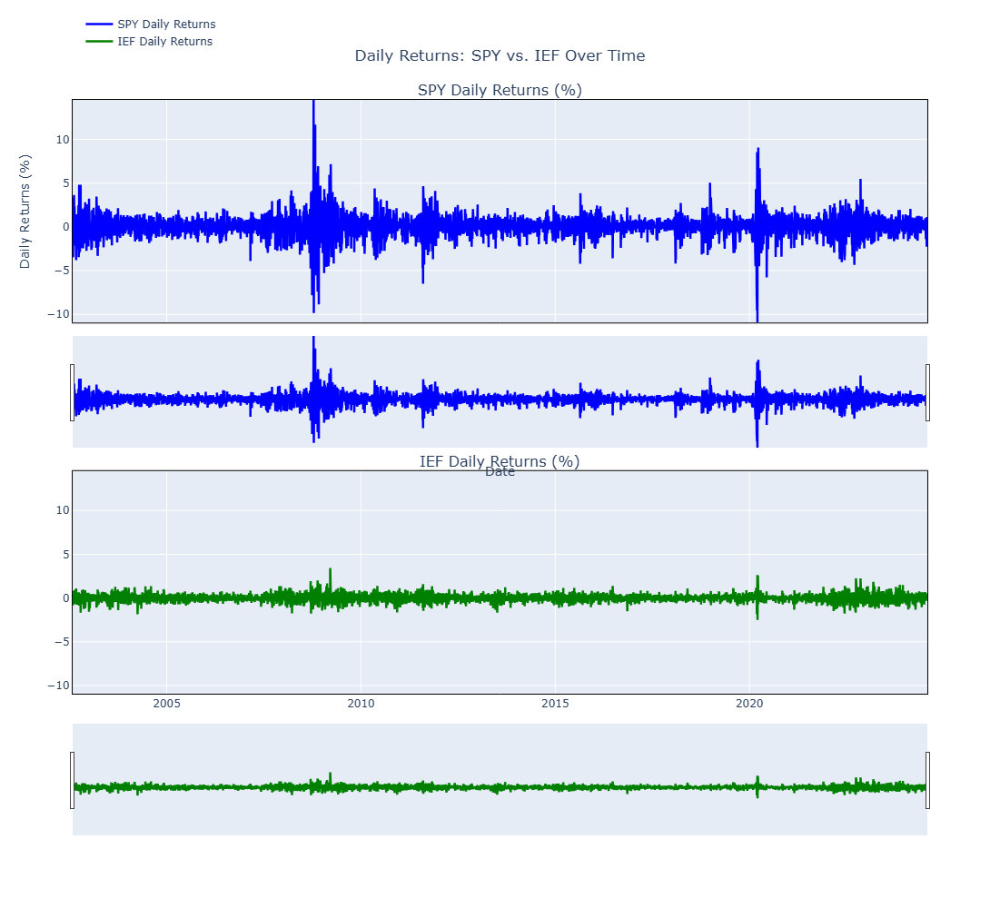

In [8]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

# Calculate combined min and max daily returns (in percentages)
combined_min = min(merged_data['Stock_Daily_Return'].min(), merged_data['Bond_Daily_Return'].min()) * 100
combined_max = max(merged_data['Stock_Daily_Return'].max(), merged_data['Bond_Daily_Return'].max()) * 100

# Create the figure with subplots
fig = make_subplots(
    rows=2, cols=1, shared_xaxes=True, 
    subplot_titles=("SPY Daily Returns (%)", "IEF Daily Returns (%)"),
    vertical_spacing=0.25  # Adjust vertical spacing as needed
)

# Add SPY daily returns line
fig.add_trace(
    go.Scatter(
        x=merged_data['Date'], 
        y=merged_data['Stock_Daily_Return'] * 100,  # Convert to percentages
        mode='lines', 
        name='SPY Daily Returns',
        line=dict(color='blue', width=2.5),
        hovertemplate='Date: %{x|%Y-%m-%d}<br>SPY Daily Return: %{y:.2f}%'
    ),
    row=1, col=1
)

# Add IEF daily returns line
fig.add_trace(
    go.Scatter(
        x=merged_data['Date'], 
        y=merged_data['Bond_Daily_Return'] * 100,  # Convert to percentages
        mode='lines', 
        name='IEF Daily Returns',
        line=dict(color='green', width=2.5),
        hovertemplate='Date: %{x|%Y-%m-%d}<br>IEF Daily Return: %{y:.2f}%'
    ),
    row=2, col=1
)

# Set the same Y-axis range for both subplots
fig.update_yaxes(range=[combined_min, combined_max], row=1, col=1)
fig.update_yaxes(range=[combined_min, combined_max], row=2, col=1)

# Add range slider for zooming
fig.update_xaxes(rangeslider_visible=True)

# Update layout with better styling
fig.update_layout(
    title={
        'text': "Daily Returns: SPY vs. IEF Over Time",
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    xaxis_title="Date",
    yaxis_title="Daily Returns (%)",
    hovermode="x unified",
    legend=dict(
        x=0.01, y=1.15, traceorder="normal",
        bgcolor="rgba(0,0,0,0)",
        bordercolor="Black"
    ),
    width=1200,
    height=1000,  
)

fig.update_xaxes(showline=True, linewidth=1, linecolor='black', mirror=True)
fig.update_yaxes(showline=True, linewidth=1, linecolor='black', mirror=True)

fig.update_layout(dragmode="pan")

daily_plot = fig

daily_plot.show()



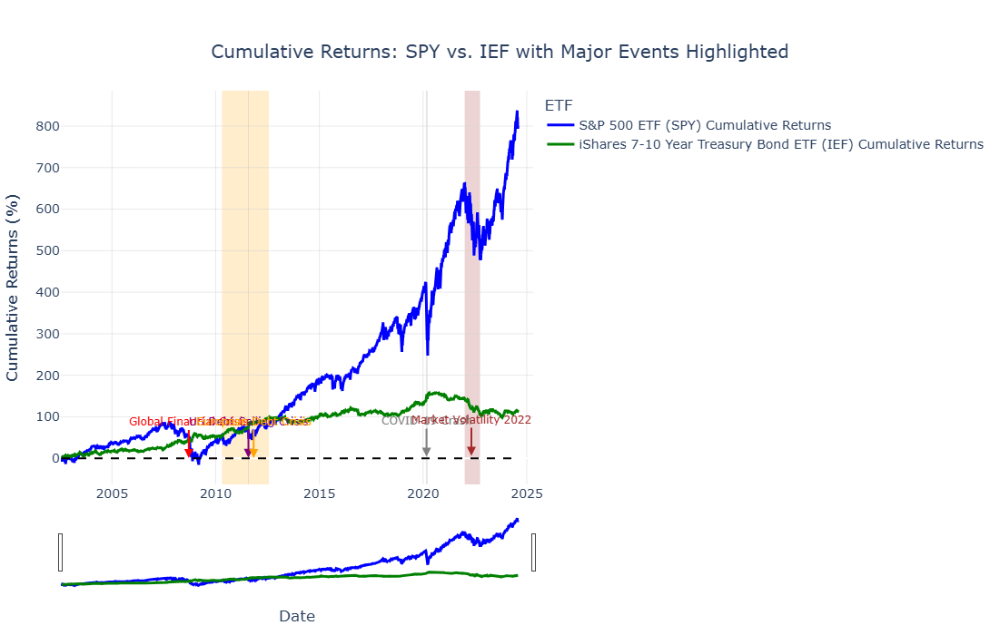

In [9]:
fig = go.Figure()

# Add cumulative stock returns to the plot
fig.add_trace(go.Scatter(
    x=merged_data['Date'],
    y=merged_data['Stock_Cumulative_Return'] * 100,
    mode='lines',
    name='S&P 500 ETF (SPY) Cumulative Returns',
    line=dict(color='blue', width=3),
    hovertemplate='Date: %{x|%Y-%m-%d}<br>SPY Cumulative Return: %{y:.2f}%'
))

# Add cumulative bond returns to the plot
fig.add_trace(go.Scatter(
    x=merged_data['Date'],
    y=merged_data['Bond_Cumulative_Return'] * 100,
    mode='lines',
    name='iShares 7-10 Year Treasury Bond ETF (IEF) Cumulative Returns',
    line=dict(color='green', width=3),
    hovertemplate='Date: %{x|%Y-%m-%d}<br>IEF Cumulative Return: %{y:.2f}%'
))

# Add a dashed line at 0% to indicate the break-even point
fig.add_shape(type="line",
              x0=merged_data['Date'].min(), y0=0, x1=merged_data['Date'].max(), y1=0,
              line=dict(color="black", width=2, dash="dash"))

# Define event periods
event_periods = [
    # Global Financial Crisis
    dict(
        type="rect",
        xref="x",
        yref="paper",
        x0='2007-10-09',
        x1='2009-03-09',
        y0=0,
        y1=1,
        fillcolor="red",
        opacity=0.2,
        layer="below",
        line_width=0,
    ),
    # European Debt Crisis
    dict(
        type="rect",
        xref="x",
        yref="paper",
        x0='2010-04-23',
        x1='2012-07-26',
        y0=0,
        y1=1,
        fillcolor="orange",
        opacity=0.2,
        layer="below",
        line_width=0,
    ),
    # US Debt Ceiling Crisis
    dict(
        type="rect",
        xref="x",
        yref="paper",
        x0='2011-07-25',
        x1='2011-08-02',
        y0=0,
        y1=1,
        fillcolor="purple",
        opacity=0.2,
        layer="below",
        line_width=0,
    ),
    # COVID-19 Pandemic Market Crash
    dict(
        type="rect",
        xref="x",
        yref="paper",
        x0='2020-02-19',
        x1='2020-03-23',
        y0=0,
        y1=1,
        fillcolor="gray",
        opacity=0.2,
        layer="below",
        line_width=0,
    ),
    # Recent Market Volatility (2022)
    dict(
        type="rect",
        xref="x",
        yref="paper",
        x0='2022-01-03',
        x1='2022-10-01',
        y0=0,
        y1=1,
        fillcolor="brown",
        opacity=0.2,
        layer="below",
        line_width=0,
    ),
]

# Add event periods to the figure
fig.update_layout(shapes=event_periods)

# Add annotations for the events
annotations = [
    dict(
        x='2008-09-15',
        y=merged_data.loc[merged_data['Date'] == '2008-09-15', 'Stock_Cumulative_Return'].values[0],
        xref='x',
        yref='y',
        text="Global Financial Crisis",
        showarrow=True,
        arrowhead=2,
        arrowsize=1,
        arrowwidth=2,
        arrowcolor='red',
        font=dict(size=12, color='red'),
        ax=0,
        ay=-40,
    ),
    dict(
        x='2011-08-01',
        y=merged_data.loc[merged_data['Date'] == '2011-08-01', 'Stock_Cumulative_Return'].values[0],
        xref='x',
        yref='y',
        text="US Debt Ceiling Crisis",
        showarrow=True,
        arrowhead=2,
        arrowsize=1,
        arrowwidth=2,
        arrowcolor='purple',
        font=dict(size=12, color='purple'),
        ax=0,
        ay=-40,
    ),
    dict(
        x='2020-03-02',
        y=merged_data.loc[merged_data['Date'] == '2020-03-02', 'Stock_Cumulative_Return'].values[0],
        xref='x',
        yref='y',
        text="COVID-19 Crash",
        showarrow=True,
        arrowhead=2,
        arrowsize=1,
        arrowwidth=2,
        arrowcolor='gray',
        font=dict(size=12, color='gray'),
        ax=0,
        ay=-40,
    ),
    dict(
        x='2011-11-01',
        y=merged_data.loc[merged_data['Date'] == '2011-11-01', 'Stock_Cumulative_Return'].values[0],
        xref='x',
        yref='y',
        text="European Debt Crisis",
        showarrow=True,
        arrowhead=2,
        arrowsize=1,
        arrowwidth=2,
        arrowcolor='orange',
        font=dict(size=12, color='orange'),
        ax=0,
        ay=-40,
    ),
    dict(
        x='2022-05-01',
        y=merged_data.loc[merged_data['Date'] == '2022-04-29', 'Stock_Cumulative_Return'].values[0],
        xref='x',
        yref='y',
        text="Market Volatility 2022",
        showarrow=True,
        arrowhead=2,
        arrowsize=1,
        arrowwidth=2,
        arrowcolor='brown',
        font=dict(size=12, color='brown'),
        ax=0,
        ay=-40,
    ),
]

fig.update_layout(annotations=annotations)

fig.update_layout(
    title={
        'text': 'Cumulative Returns: SPY vs. IEF with Major Events Highlighted',
        'x': 0.5,  # Center the title
        'xanchor': 'center',
        'yanchor': 'top'
    },
    xaxis_title='Date',
    yaxis_title='Cumulative Returns (%)',
    hovermode='x unified',  # Unified hover for both lines
    legend_title_text='ETF',
    plot_bgcolor='white',  # White background for clarity
    font=dict(size=14)  
)

# Add grid and range slider
fig.update_xaxes(
    rangeslider_visible=True, 
    showgrid=True, gridwidth=0.5, gridcolor='lightgray'
)
fig.update_yaxes(showgrid=True, gridwidth=0.5, gridcolor='lightgray')

# Increase figure size
fig.update_layout(
    width=1200,  
    height=700,  
    margin=dict(l=50, r=50, t=100, b=50)  
)

cumulative_plot = fig
cumulative_plot.show()


In [10]:
window_size = 30
merged_data['Rolling_Correlation'] = merged_data['Stock_Daily_Return'].rolling(window=window_size).corr(merged_data['Bond_Daily_Return'])
merged_data.columns = [col[0] for col in merged_data.columns]

In [11]:
# Categorize Rolling Correlation
def categorize_correlation(value):
    if value > 0.5:
        return 'Positive'
    elif value < -0.5:
        return 'Negative'
    else:
        return 'Neutral'

merged_data['Correlation_Category'] = merged_data['Rolling_Correlation'].apply(categorize_correlation)

# Ensure that Altair can handle large datasets
alt.data_transformers.disable_max_rows()

# Create the Rolling Correlation Plot
scatter_chart = alt.Chart(merged_data).mark_circle(size=60, opacity=0.7).encode(
    x=alt.X('Date:T', title='Date', axis=alt.Axis(labelFontSize=12, titleFontSize=14)),
    y=alt.Y('Rolling_Correlation:Q', title=f'Rolling {window_size}-Day Correlation', axis=alt.Axis(labelFontSize=12, titleFontSize=14)),
    color=alt.Color('Correlation_Category:N', 
                    scale=alt.Scale(domain=['Positive', 'Negative', 'Neutral'],
                                    range=['green', 'red', 'gray']),
                    legend=alt.Legend(title="Correlation Category")),
    tooltip=[
        alt.Tooltip('Date:T', format='%Y-%m-%d'),
        alt.Tooltip('Rolling_Correlation:Q', format='.2f'),
        alt.Tooltip('Stock_Daily_Return:Q', title='Stock Daily Return', format='.4f'),
        alt.Tooltip('Bond_Daily_Return:Q', title='Bond Daily Return', format='.4f')
    ]
).properties(
    title=alt.TitleParams(
        text=f'Rolling {window_size}-Day Correlation Between SPY and IEF Returns',
        fontSize=16,
        anchor='middle',
        color='black'
    ),
    width=900,
    height=500
)

line_chart = alt.Chart(merged_data).mark_line(strokeWidth=2, color='grey').encode(
    x='Date:T',
    y='Rolling_Correlation:Q'
)

annotations_data = pd.DataFrame([
    {'Date': '2008-09-15', 'Event': 'Lehman Brothers Collapse'},
    {'Date': '2020-03-01', 'Event': 'COVID-19 Market Crash'},
    {'Date': '2022-02-24', 'Event': 'Russia-Ukraine Conflict'}
])

annotations_data['Date'] = pd.to_datetime(annotations_data['Date'])

annotation_layer = alt.Chart(annotations_data).mark_rule(
    color='red', strokeDash=[5, 5], size=2
).encode(
    x='Date:T',
    tooltip=['Event:N']
)

zero_line = alt.Chart(pd.DataFrame({'y': [0]})).mark_rule(
    strokeDash=[4, 4], color='black', size=2
).encode(
    y='y:Q'
)

positive_threshold = alt.Chart(pd.DataFrame({'y': [0.5]})).mark_rule(
    strokeDash=[4, 4], color='gray', size=1.5
).encode(
    y='y:Q'
)

negative_threshold = alt.Chart(pd.DataFrame({'y': [-0.5]})).mark_rule(
    strokeDash=[4, 4], color='gray', size=1.5
).encode(
    y='y:Q'
)

# Create annotations_data with significant events
annotations_data = pd.DataFrame([
    # Negative Correlation Events
    {'Date': '2002-10-09', 'Event': 'Market Bottom after Dot-Com Crash'},
    {'Date': '2003-03-20', 'Event': 'Start of Iraq War'},
    {'Date': '2008-10-10', 'Event': 'Global Financial Crisis'},
    {'Date': '2010-06-01', 'Event': 'European Debt Crisis'},
    {'Date': '2011-11-01', 'Event': 'European Debt Crisis Escalation'},
    {'Date': '2020-02-20', 'Event': 'COVID-19 Pandemic Begins'},
    # Positive Correlation Events
    {'Date': '2004-05-01', 'Event': 'Economic Expansion'},
    {'Date': '2006-05-01', 'Event': 'Pre-2007 Market Peak'},
    {'Date': '2021-06-01', 'Event': 'Post-COVID Recovery'},
    {'Date': '2022-06-01', 'Event': 'Inflation and Rate Hikes'},
])

# Convert 'Date' column to datetime
annotations_data['Date'] = pd.to_datetime(annotations_data['Date'])

# Create the annotation layer with the updated events
annotation_layer = alt.Chart(annotations_data).mark_rule(
    color='red', strokeDash=[5, 5], size=2
).encode(
    x='Date:T',
    tooltip=['Event:N']
)

# Combine all chart elements
final_chart = (
    line_chart + scatter_chart + annotation_layer + zero_line + positive_threshold + negative_threshold
).interactive()

corr_plot = final_chart
corr_plot


alt.LayerChart(...)

In [12]:
# Define the rolling window size
window_size = 30

# Calculate rolling 30-day volatility for SPY and IEF
merged_data['Stock_Rolling_Volatility'] = merged_data['Stock_Daily_Return'].rolling(window=window_size).std() * 100  
merged_data['Bond_Rolling_Volatility'] = merged_data['Bond_Daily_Return'].rolling(window=window_size).std() * 100    

# Drop rows with NaN values
volatility_data = merged_data.dropna(subset=['Stock_Rolling_Volatility', 'Bond_Rolling_Volatility'])

In [13]:
# Extract the necessary data
x = volatility_data['Date']
y_stock = volatility_data['Stock_Rolling_Volatility']
y_bond = volatility_data['Bond_Rolling_Volatility']

In [14]:
# Identify the intersection points
intersect_indices = np.where(np.diff(np.sign(y_stock - y_bond)))[0]
intersect_dates = x.iloc[intersect_indices]
intersect_values = (y_stock.iloc[intersect_indices] + y_bond.iloc[intersect_indices]) / 2

# Create separate x and y arrays for each segment
filled_areas = []
prev_index = 0

for i in range(len(intersect_indices)):
    curr_index = intersect_indices[i] + 1  # Include the intersection point
    if y_stock.iloc[prev_index] > y_bond.iloc[prev_index]:
        # Stock volatility is higher
        filled_areas.append({
            'x': np.concatenate([x.iloc[prev_index:curr_index], x.iloc[prev_index:curr_index][::-1]]),
            'y': np.concatenate([y_stock.iloc[prev_index:curr_index], y_bond.iloc[prev_index:curr_index][::-1]]),
            'color': 'rgba(255, 0, 0, 0.3)'  # Red
        })
    else:
        # Bond volatility is higher
        filled_areas.append({
            'x': np.concatenate([x.iloc[prev_index:curr_index], x.iloc[prev_index:curr_index][::-1]]),
            'y': np.concatenate([y_bond.iloc[prev_index:curr_index], y_stock.iloc[prev_index:curr_index][::-1]]),
            'color': 'rgba(255, 165, 0, 0.3)'  # Orange
        })
    prev_index = curr_index

# Add the last segment
if y_stock.iloc[prev_index] > y_bond.iloc[prev_index]:
    filled_areas.append({
        'x': np.concatenate([x.iloc[prev_index:], x.iloc[prev_index:][::-1]]),
        'y': np.concatenate([y_stock.iloc[prev_index:], y_bond.iloc[prev_index:][::-1]]),
        'color': 'rgba(255, 0, 0, 0.3)'  # Red
    })
else:
    filled_areas.append({
        'x': np.concatenate([x.iloc[prev_index:], x.iloc[prev_index:][::-1]]),
        'y': np.concatenate([y_bond.iloc[prev_index:], y_stock.iloc[prev_index:][::-1]]),
        'color': 'rgba(255, 165, 0, 0.3)'  # Orange
    })


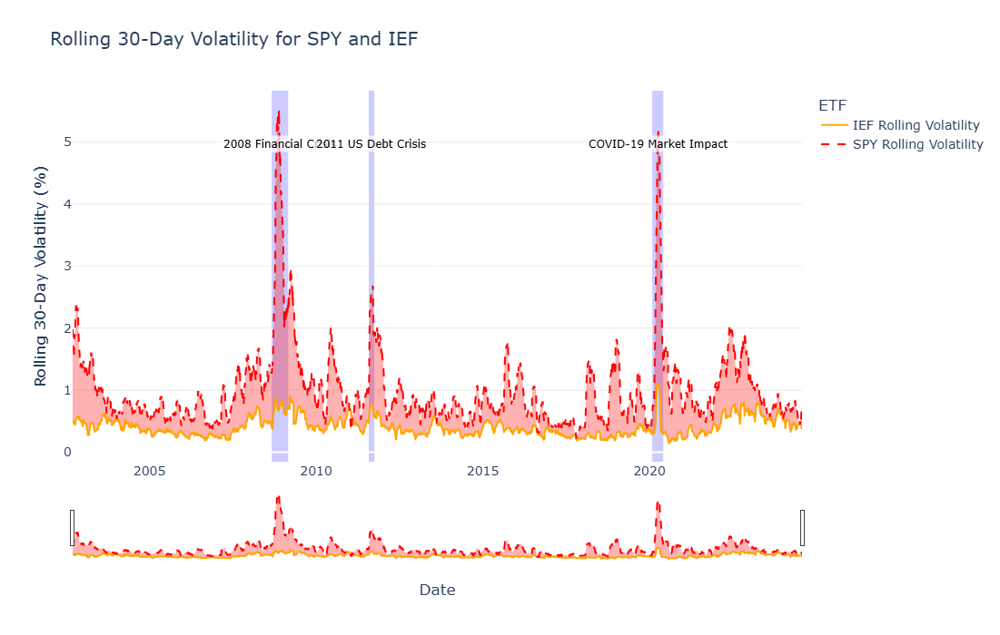

In [15]:
from datetime import datetime

fig = go.Figure()

for area in filled_areas:
    fig.add_trace(go.Scatter(
        x=area['x'],
        y=area['y'],
        fill='toself',
        fillcolor=area['color'],
        line=dict(width=0),
        hoverinfo='skip',
        showlegend=False,
        mode='none'
    ))

# Add the base traces for bond and stock volatility
fig.add_trace(go.Scatter(
    x=x,
    y=y_bond,
    mode='lines',
    name='IEF Rolling Volatility',
    line=dict(color='orange', width=2),
    hovertemplate='Date: %{x|%Y-%m-%d}<br>IEF Volatility: %{y:.2f}%'
))

fig.add_trace(go.Scatter(
    x=x,
    y=y_stock,
    mode='lines',
    name='SPY Rolling Volatility',
    line=dict(color='red', dash='dash', width=2),
    hovertemplate='Date: %{x|%Y-%m-%d}<br>SPY Volatility: %{y:.2f}%'
))

# Define the event periods
events = [
    {
        'name': 'Global Financial Crisis',
        'start': datetime.strptime('2008-09-01', '%Y-%m-%d'),
        'end': datetime.strptime('2009-03-01', '%Y-%m-%d'),
        'color': 'rgba(0, 0, 255, 0.2)',  # Light red
        'text': '2008 Financial Crisis'
    },
    {
        'name': 'US Debt Downgrade',
        'start': datetime.strptime('2011-08-01', '%Y-%m-%d'),
        'end': datetime.strptime('2011-10-01', '%Y-%m-%d'),
        'color': 'rgba(0, 0, 255, 0.2)',  # Light orange
        'text': '2011 US Debt Crisis'
    },
    {
        'name': 'COVID-19 Market Impact',
        'start': datetime.strptime('2020-02-01', '%Y-%m-%d'),
        'end': datetime.strptime('2020-06-01', '%Y-%m-%d'),
        'color': 'rgba(0, 0, 255, 0.2)',  # Light blue
        'text': 'COVID-19 Market Impact'
    }
]

# Add shaded rectangles and annotations for each event
for event in events:
    fig.add_shape(
        type="rect",
        xref='x',
        yref='paper',
        x0=event['start'],
        x1=event['end'],
        y0=0,
        y1=1,
        fillcolor=event['color'],
        line=dict(width=0),
        layer='below'
    )

    fig.add_annotation(
        x=event['start'] + (event['end'] - event['start']) / 2,
        y=max(y_stock.max(), y_bond.max()) * 0.9,
        xref='x',
        yref='y',
        text=event['text'],
        showarrow=False,
        font=dict(size=12, color="black"),
        bgcolor="rgba(255, 255, 255, 0.7)",
        xanchor="center"
    )

fig.update_layout(
    title='Rolling 30-Day Volatility for SPY and IEF',
    xaxis_title='Date',
    yaxis_title='Rolling 30-Day Volatility (%)',
    hovermode='x unified',
    legend_title_text='ETF',
    plot_bgcolor='white',
    paper_bgcolor='white',
    width=1200,
    height=700,
    font=dict(size=14)
)

# Add zooming, panning, and range slider
fig.update_xaxes(rangeslider_visible=True)
fig.update_yaxes(showgrid=True, gridwidth=0.5, gridcolor='lightgray')

volatility_plot = fig
volatility_plot.show()


In [16]:
# Define the rolling window size
window = 126  # 21 days/month * 6 months

# Define the risk-free rate (assumed to be zero for simplicity)
risk_free_rate = 0

# Calculate rolling Sharpe Ratios for stock and bond
merged_data['Stock_Rolling_Sharpe'] = (
    (merged_data['Stock_Daily_Return'].rolling(window).mean() - risk_free_rate) /
    merged_data['Stock_Daily_Return'].rolling(window).std()
)

merged_data['Bond_Rolling_Sharpe'] = (
    (merged_data['Bond_Daily_Return'].rolling(window).mean() - risk_free_rate) /
    merged_data['Bond_Daily_Return'].rolling(window).std()
)


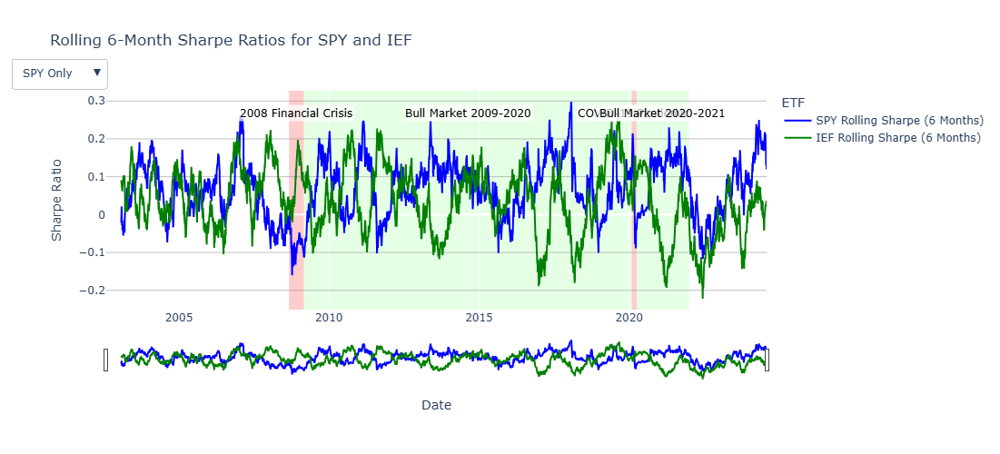

In [17]:
import plotly.graph_objects as go
from datetime import datetime

fig_sharpe = go.Figure()

# Add SPY (stock) rolling Sharpe trace
fig_sharpe.add_trace(go.Scatter(
    x=merged_data['Date'], 
    y=merged_data['Stock_Rolling_Sharpe'], 
    mode='lines', 
    name='SPY Rolling Sharpe (6 Months)',
    line=dict(color='blue'),
    hovertemplate='Date: %{x|%Y-%m-%d}<br>SPY Sharpe Ratio: %{y:.2f}',
))

# Add IEF (bond) rolling Sharpe trace
fig_sharpe.add_trace(go.Scatter(
    x=merged_data['Date'], 
    y=merged_data['Bond_Rolling_Sharpe'], 
    mode='lines', 
    name='IEF Rolling Sharpe (6 Months)',
    line=dict(color='green'),
    hovertemplate='Date: %{x|%Y-%m-%d}<br>IEF Sharpe Ratio: %{y:.2f}',
))

# Define the event periods
events = [
    {
        'name': '2008 Financial Crisis',
        'start': datetime(2008, 9, 1),
        'end': datetime(2009, 3, 1),
        'color': 'rgba(255, 0, 0, 0.2)', 
        'text': '2008 Financial Crisis'
    },
    {
        'name': 'Bull Market',
        'start': datetime(2009, 3, 1),
        'end': datetime(2020, 2, 1),
        'color': 'rgba(0, 255, 0, 0.1)',  
        'text': 'Bull Market 2009-2020'
    },
    {
        'name': 'COVID-19 Pandemic',
        'start': datetime(2020, 2, 1),
        'end': datetime(2020, 4, 1),
        'color': 'rgba(255, 0, 0, 0.2)',  
        'text': 'COVID-19 Pandemic'
    },
    {
        'name': 'Post-COVID Bull Market',
        'start': datetime(2020, 4, 1),
        'end': datetime(2021, 12, 31), 
        'color': 'rgba(0, 255, 0, 0.1)',  
        'text': 'Bull Market 2020-2021'
    }
]

# Add shaded rectangles and annotations for each event
for event in events:
    fig_sharpe.add_shape(
        type="rect",
        xref='x',
        yref='paper',
        x0=event['start'],
        x1=event['end'],
        y0=0,
        y1=1,
        fillcolor=event['color'],
        line=dict(width=0),
        layer='below'
    )
    
    fig_sharpe.add_annotation(
        x=event['start'] + (event['end'] - event['start']) / 2,
        y=max(merged_data['Stock_Rolling_Sharpe'].max(), merged_data['Bond_Rolling_Sharpe'].max()) * 0.9,
        xref='x',
        yref='y',
        text=event['text'],
        showarrow=False,
        font=dict(size=12, color="black"),
        bgcolor="rgba(255, 255, 255, 0.7)",
        xanchor="center"
    )

# Customize layout with interactivity
fig_sharpe.update_layout(
    title='Rolling 6-Month Sharpe Ratios for SPY and IEF',
    xaxis_title='Date',
    yaxis_title='Sharpe Ratio',
    hovermode='x unified',
    legend_title_text='ETF',
    plot_bgcolor='white',
    width=1000,
    height=500,
    updatemenus=[
        {
            "buttons": [
                {
                    "args": [{"visible": [True, False] + [True]*len(events)}],
                    "label": "SPY Only",
                    "method": "update"
                },
                {
                    "args": [{"visible": [False, True] + [True]*len(events)}],
                    "label": "IEF Only",
                    "method": "update"
                },
                {
                    "args": [{"visible": [True, True] + [True]*len(events)}],
                    "label": "Show Both",
                    "method": "update"
                }
            ],
            "direction": "down",
            "showactive": True,
            "x": 0.0,
            "y": 1.15
        }
    ]
)

# Add zooming, panning, and range slider 
fig_sharpe.update_xaxes(rangeslider_visible=True, title_font=dict(size=14))
fig_sharpe.update_yaxes(showgrid=True, gridwidth=0.5, gridcolor='gray')

# Show the plot
fig_sharpe.show()



In [18]:
import plotly.graph_objects as go
from datetime import datetime

# Function to calculate downside standard deviation
def downside_std(returns):
    return np.sqrt(np.mean(np.square(np.minimum(returns - 0, 0))))
    
# Calculate rolling Sortino Ratios for stock and bond
merged_data['Stock_Rolling_Sortino'] = (
    (merged_data['Stock_Daily_Return'].rolling(window).mean() - risk_free_rate) / 
    merged_data['Stock_Daily_Return'].rolling(window).apply(downside_std)
)

merged_data['Bond_Rolling_Sortino'] = (
    (merged_data['Bond_Daily_Return'].rolling(window).mean() - risk_free_rate) / 
    merged_data['Bond_Daily_Return'].rolling(window).apply(downside_std)
)


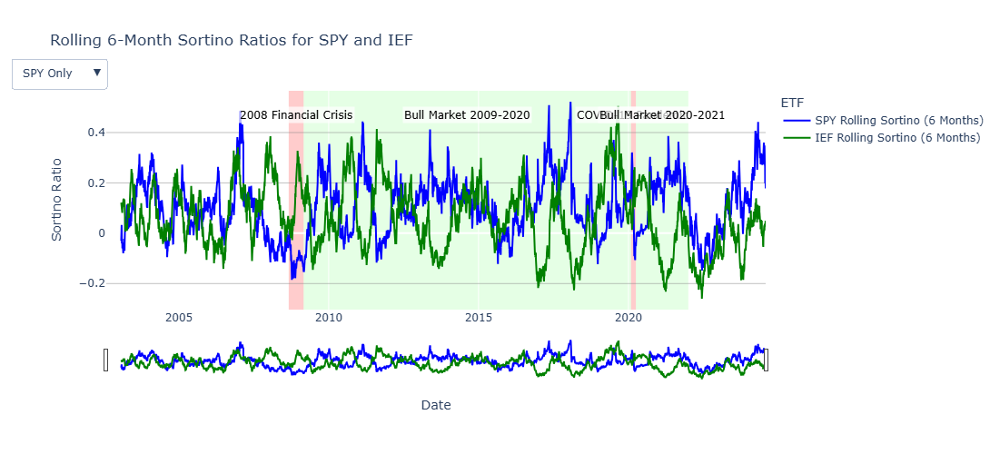

In [19]:
import plotly.graph_objects as go
from datetime import datetime

fig_sortino = go.Figure()

# Add SPY (stock) rolling Sortino trace
fig_sortino.add_trace(go.Scatter(
    x=merged_data['Date'], 
    y=merged_data['Stock_Rolling_Sortino'], 
    mode='lines', 
    name='SPY Rolling Sortino (6 Months)',
    line=dict(color='blue'),
    hovertemplate='Date: %{x|%Y-%m-%d}<br>SPY Sortino Ratio: %{y:.2f}',
))

# Add IEF (bond) rolling Sortino trace
fig_sortino.add_trace(go.Scatter(
    x=merged_data['Date'], 
    y=merged_data['Bond_Rolling_Sortino'], 
    mode='lines', 
    name='IEF Rolling Sortino (6 Months)',
    line=dict(color='green'),
    hovertemplate='Date: %{x|%Y-%m-%d}<br>IEF Sortino Ratio: %{y:.2f}',
))

# Add shaded rectangles and annotations for each event
for event in events:
    fig_sortino.add_shape(
        type="rect",
        xref='x',
        yref='paper',
        x0=event['start'],
        x1=event['end'],
        y0=0,
        y1=1,
        fillcolor=event['color'],
        line=dict(width=0),
        layer='below'
    )

    fig_sortino.add_annotation(
        x=event['start'] + (event['end'] - event['start']) / 2,
        y=max(merged_data['Stock_Rolling_Sortino'].max(), merged_data['Bond_Rolling_Sortino'].max()) * 0.9,
        xref='x',
        yref='y',
        text=event['text'],
        showarrow=False,
        font=dict(size=12, color="black"),
        bgcolor="rgba(255, 255, 255, 0.7)",
        xanchor="center"
    )

# Customize layout
fig_sortino.update_layout(
    title='Rolling 6-Month Sortino Ratios for SPY and IEF',
    xaxis_title='Date',
    yaxis_title='Sortino Ratio',
    hovermode='x unified',
    legend_title_text='ETF',
    plot_bgcolor='white',
    width=1000,
    height=500,
    updatemenus=[
        {
            "buttons": [
                {
                    "args": [{"visible": [True, False] + [True]*len(events)}],
                    "label": "SPY Only",
                    "method": "update"
                },
                {
                    "args": [{"visible": [False, True] + [True]*len(events)}],
                    "label": "IEF Only",
                    "method": "update"
                },
                {
                    "args": [{"visible": [True, True] + [True]*len(events)}],
                    "label": "Show Both",
                    "method": "update"
                }
            ],
            "direction": "down",
            "showactive": True,
            "x": 0.0,
            "y": 1.15
        }
    ]
)

# Add zooming, panning, and range slider for interaction
fig_sortino.update_xaxes(rangeslider_visible=True, title_font=dict(size=14))
fig_sortino.update_yaxes(showgrid=True, gridwidth=0.5, gridcolor='gray')

# Show the plot
fig_sortino.show()


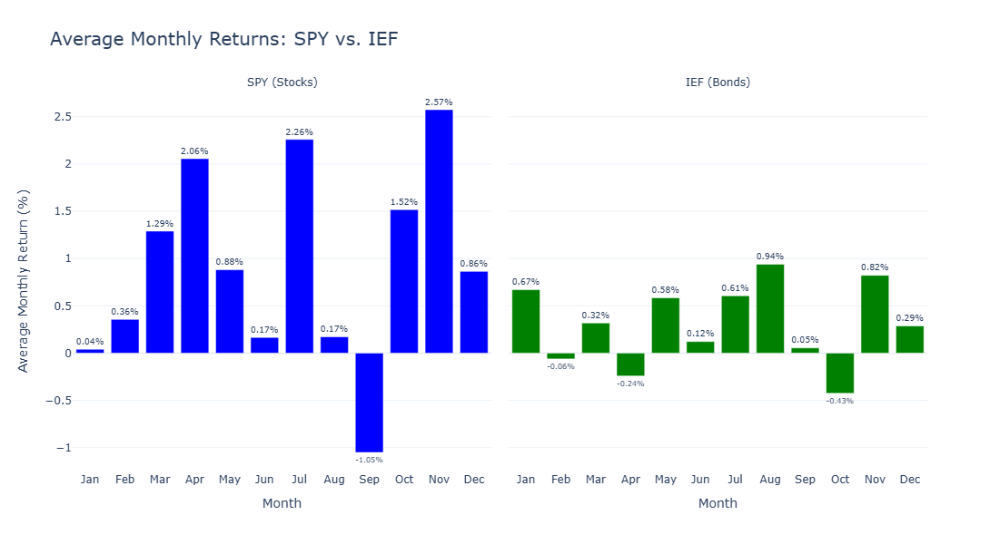

In [20]:
merged_data2 = merged_data.copy()
# Reset index to have 'Date' as a column
merged_data2.reset_index(inplace=True)

# Calculate cumulative returns to reconstruct price indices
merged_data2['Stock_Price_Index'] = (1 + merged_data2['Stock_Daily_Return']).cumprod()
merged_data2['Bond_Price_Index'] = (1 + merged_data2['Bond_Daily_Return']).cumprod() 


# Set 'Date' as index again
merged_data2.set_index('Date', inplace=True)

# Resample to monthly frequency and calculate monthly returns
monthly_returns = merged_data2[['Stock_Price_Index', 'Bond_Price_Index']].resample('M').last().pct_change().dropna()
monthly_returns.reset_index(inplace=True)

# Extract month names
monthly_returns['Month'] = monthly_returns['Date'].dt.month.apply(
    lambda x: ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'][x - 1]
)

# Calculate average monthly returns
average_monthly_returns = monthly_returns.groupby('Month')[['Stock_Price_Index', 'Bond_Price_Index']].mean().reset_index()

average_monthly_returns[['Stock_Price_Index', 'Bond_Price_Index']] *= 100

# Melt the DataFrame for plotting
average_monthly_returns_melted = average_monthly_returns.melt(
    id_vars=['Month'],
    value_vars=['Stock_Price_Index', 'Bond_Price_Index'],
    var_name='Asset Class',
    value_name='Average Monthly Return (%)'
)

# Replace asset class names
average_monthly_returns_melted['Asset Class'] = average_monthly_returns_melted['Asset Class'].replace({
    'Stock_Price_Index': 'SPY (Stocks)',
    'Bond_Price_Index': 'IEF (Bonds)'
})
fig = px.bar(
    average_monthly_returns_melted,
    x='Month',
    y='Average Monthly Return (%)',
    color='Asset Class',
    facet_col='Asset Class',
    title='Average Monthly Returns: SPY vs. IEF',
    text='Average Monthly Return (%)',
    template='plotly_white',
    color_discrete_map={'SPY (Stocks)': 'blue', 'IEF (Bonds)': 'green'},
    category_orders={'Month': ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']}
)

# Update traces
fig.update_traces(
    texttemplate='%{text:.2f}%',
    textposition='outside',
    hovertemplate='Month: %{x}<br>Average Monthly Return: %{y:.2f}%'
)

# Update layout
fig.update_layout(
    xaxis_title='Month',
    yaxis_title='Average Monthly Return (%)',
    height=600,
    width=1000,
    showlegend=False,
    title_font=dict(size=20)
)

# Adjust facet subplot titles
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))

seasonality_plot = fig
seasonality_plot.show()



In [21]:
import pandas as pd
import numpy as np
import yfinance as yf
import plotly.graph_objects as go
from datetime import datetime, timedelta
import ipywidgets as widgets
from IPython.display import display
from ipywidgets import interact, interactive, fixed

# Fetch Historical Data
stock_ticker = 'SPY'  # S&P 500 ETF
bond_ticker = 'IEF'   # iShares 7-10 Year Treasury Bond ETF

start_date = '2002-07-31'  
end_date = datetime.today().strftime('%Y-%m-%d')

stock_data = yf.download(stock_ticker, start=start_date, end=end_date, progress=False)
bond_data = yf.download(bond_ticker, start=start_date, end=end_date, progress=False)

# Calculate Daily Returns
stock_data['Stock_Daily_Return'] = stock_data['Adj Close'].pct_change()
bond_data['Bond_Daily_Return'] = bond_data['Adj Close'].pct_change()

# Prepare the Merged Data
stock_data.reset_index(inplace=True)
bond_data.reset_index(inplace=True)
stock_data.columns = [col[0] for col in stock_data.columns]
bond_data.columns = [col[0] for col in bond_data.columns]

merged_data = pd.merge(
    stock_data[['Date', 'Stock_Daily_Return']],
    bond_data[['Date', 'Bond_Daily_Return']],
    on='Date'
)
merged_data.dropna(inplace=True)

merged_data['Date'] = pd.to_datetime(merged_data['Date'])

# Calculate Cumulative Returns
merged_data['Stock_Cumulative_Return'] = (1 + merged_data['Stock_Daily_Return']).cumprod() - 1
merged_data['Bond_Cumulative_Return'] = (1 + merged_data['Bond_Daily_Return']).cumprod() - 1

# Investment Amount Widget
investment_amount_widget = widgets.FloatText(
    value=1000.0,
    description='Investment Amount ($):',
    step=100.0,
    style={'description_width': 'initial'}
)

# Investment Duration Widget
investment_duration_widget = widgets.IntSlider(
    value=5,
    min=1,
    max=20,
    step=1,
    description='Investment Duration (Years):',
    style={'description_width': 'initial'},
    continuous_update=False
)

# Asset Selection Widget
asset_selection_widget = widgets.SelectMultiple(
    options=['SPY (Stocks)', 'IEF (Bonds)'],
    value=['SPY (Stocks)', 'IEF (Bonds)'],
    description='Select Assets:',
    style={'description_width': 'initial'}
)

# Function to calculate investment value
def calculate_investment_value(investment_amount, duration_years, assets_selected):
    # Ensure valid investment amount and duration
    if investment_amount <= 0:
        print("Investment amount must be greater than zero.")
        return
    if duration_years <= 0:
        print("Investment duration must be at least 1 year.")
        return

    # Determine the start date for the investment period
    end_date = merged_data['Date'].iloc[-1]
    start_date = end_date - timedelta(days=duration_years * 365)

    # Ensure there is enough data for the selected duration
    if start_date < merged_data['Date'].iloc[0]:
        print("Not enough historical data for the selected duration.")
        return

    # Filter data for the investment period
    investment_period_data = merged_data[(merged_data['Date'] >= start_date) & (merged_data['Date'] <= end_date)].copy()

    # Reset cumulative returns for the investment period
    investment_period_data['Stock_Cumulative_Return'] = (1 + investment_period_data['Stock_Daily_Return']).cumprod() - 1
    investment_period_data['Bond_Cumulative_Return'] = (1 + investment_period_data['Bond_Daily_Return']).cumprod() - 1

    # Calculate investment value over time
    investment_period_data['Stock_Investment_Value'] = (
        investment_amount * (1 + investment_period_data['Stock_Cumulative_Return'])
    )
    investment_period_data['Bond_Investment_Value'] = (
        investment_amount * (1 + investment_period_data['Bond_Cumulative_Return'])
    )

    # the investment growth
    fig = go.Figure()

    if 'SPY (Stocks)' in assets_selected:
        fig.add_trace(go.Scatter(
            x=investment_period_data['Date'],
            y=investment_period_data['Stock_Investment_Value'],
            mode='lines',
            name='SPY Investment Value',
            line=dict(color='blue'),
            hovertemplate='Date: %{x|%Y-%m-%d}<br>Value: $%{y:,.2f}'
        ))

    if 'IEF (Bonds)' in assets_selected:
        fig.add_trace(go.Scatter(
            x=investment_period_data['Date'],
            y=investment_period_data['Bond_Investment_Value'],
            mode='lines',
            name='IEF Investment Value',
            line=dict(color='green'),
            hovertemplate='Date: %{x|%Y-%m-%d}<br>Value: $%{y:,.2f}'
        ))

    # Update layout
    fig.update_layout(
        title=f'Investment Growth Over {duration_years} Years',
        xaxis_title='Date',
        yaxis_title='Investment Value ($)',
        hovermode='x unified',
        legend_title_text='Asset',
        plot_bgcolor='white',
        width=900,
        height=500
    )

    # Show the figure
    fig.show()

    # Display final investment values
    final_values = {}
    if 'SPY (Stocks)' in assets_selected:
        final_stock_value = investment_period_data['Stock_Investment_Value'].iloc[-1]
        total_stock_return = ((final_stock_value - investment_amount) / investment_amount) * 100
        final_values['SPY (Stocks)'] = (final_stock_value, total_stock_return)
    if 'IEF (Bonds)' in assets_selected:
        final_bond_value = investment_period_data['Bond_Investment_Value'].iloc[-1]
        total_bond_return = ((final_bond_value - investment_amount) / investment_amount) * 100
        final_values['IEF (Bonds)'] = (final_bond_value, total_bond_return)

    # Print the results
    for asset, (value, return_percent) in final_values.items():
        print(f"\n{asset}:")
        print(f"Final Investment Value: ${value:,.2f}")
        print(f"Total Return: {return_percent:.2f}% over {duration_years} years")

# Create an interactive function
interact(
    calculate_investment_value,
    investment_amount=investment_amount_widget,
    duration_years=investment_duration_widget,
    assets_selected=asset_selection_widget
)


interactive(children=(FloatText(value=1000.0, description='Investment Amount ($):', step=100.0, style=Descript…

<function __main__.calculate_investment_value(investment_amount, duration_years, assets_selected)>

In [22]:
import dash
from dash import dcc, html
import dash_bootstrap_components as dbc
from dash.dependencies import Input, Output, State
from datetime import datetime, timedelta
import webbrowser
from threading import Timer

merged_data_investment = pd.merge(
    stock_data[['Date', 'Stock_Daily_Return']],
    bond_data[['Date', 'Bond_Daily_Return']],
    on='Date'
)
merged_data_investment.dropna(inplace=True)

merged_data_investment['Date'] = pd.to_datetime(merged_data_investment['Date'])

daily_plot.update_layout(width=1400, height=800)
cumulative_plot.update_layout(width=1400, height=800)
volatility_plot.update_layout(width=1400, height=800)
fig_sharpe.update_layout(width=1500, height=800)
fig_sortino.update_layout(width=1500, height=800)
seasonality_plot.update_layout(width=1400, height=800)


corr_plot.save('corr_plot.html')

# Initialize 
app = dash.Dash(__name__, external_stylesheets=[dbc.themes.BOOTSTRAP], suppress_callback_exceptions=True)
app.title = "Stock and Bond Analysis"

# Define 
app.layout = dbc.Container([
    html.H1("Stock and Bond Analysis Dashboard", style={'textAlign': 'center'}),
    html.Hr(),
    dcc.Tabs(id='tabs', value='tab-1', children=[
        dcc.Tab(label='Daily Returns', value='tab-1'),
        dcc.Tab(label='Cumulative Returns', value='tab-2'),
        dcc.Tab(label='Correlation Analysis', value='tab-3'),
        dcc.Tab(label='Volatility Analysis', value='tab-4'),
        dcc.Tab(label='Risk-Adjusted Performance', value='tab-5'),
        dcc.Tab(label='Seasonality Analysis', value='tab-6'),
        dcc.Tab(label='Investment Simulation', value='tab-7'),
    ]),
    html.Div(id='tabs-content')
], fluid=True)

# Callback for main tabs
@app.callback(Output('tabs-content', 'children'),
              Input('tabs', 'value'))
def render_content(tab):
    if tab == 'tab-1':
        return dbc.Container([
            html.H3('Daily Returns Comparison'),
            dcc.Graph(figure=daily_plot),
            html.P("In this section, we compare the daily returns of stocks and bonds, Stocks exhibit higher daily fluctuations compared to bonds, showcasing greater short-term risk.")
        ])
    elif tab == 'tab-2':
        return dbc.Container([
            html.H3('Cumulative Returns Comparison'),
            dcc.Graph(figure=cumulative_plot),
            html.P("This section presents the cumulative returns over time, Stocks show superior cumulative growth potential but with higher associated risk; bonds offer stability.")
        ])
    elif tab == 'tab-3':
        return dbc.Container([
            html.H3("Rolling Correlation Analysis"),
            html.Iframe(srcDoc=open('corr_plot.html', 'r').read(), width="100%", height="600px"),
            html.P("Bonds act as a hedge during crises with negative correlations; otherwise, weak or no consistent correlation with stocks.")
        ])
    elif tab == 'tab-4':
        return dbc.Container([
            html.H3('Volatility Analysis'),
            dcc.Graph(figure=volatility_plot),
            html.P("Stocks consistently show higher rolling volatility than bonds, with spikes during economic uncertainty.")
        ])
    elif tab == 'tab-5':
        return dbc.Container([
            html.H3('Risk-Adjusted Performance'),
            dcc.Tabs(id='subtabs', value='subtab-1', children=[
                dcc.Tab(label='Sharpe Ratio', value='subtab-1'),
                dcc.Tab(label='Sortino Ratio', value='subtab-2'),
            ]),
            html.Div(id='subtabs-content')
        ])
    elif tab == 'tab-6':
        return dbc.Container([
            html.H3('Seasonality Analysis'),
            dcc.Graph(figure=seasonality_plot),
            html.P("Seasonal trends suggest specific months may have consistently higher or lower average returns for stocks and bonds.")
        ])
    elif tab == 'tab-7':
        return dbc.Container([
            html.H3('Investment Simulation'),
            html.Div([
                dbc.Form([
                    dbc.Row([
                        dbc.Col([
                            dbc.Label('Investment Amount ($):'),
                            dbc.Input(id='investment-amount', type='number', value=1000, min=0),
                        ], width=4),
                        dbc.Col([
                            dbc.Label('Investment Duration (Years):'),
                            dcc.Slider(
                                id='investment-duration',
                                min=1,
                                max=20,
                                step=1,
                                value=5,
                                marks={i: str(i) for i in range(1, 21)},
                            ),
                        ], width=6),
                    ], align='center'),
                    dbc.Row([
                        dbc.Col([
                            dbc.Label('Select Assets:'),
                            dcc.Checklist(
                                id='asset-selection',
                                options=[
                                    {'label': 'SPY (Stocks)', 'value': 'SPY'},
                                    {'label': 'IEF (Bonds)', 'value': 'IEF'},
                                ],
                                value=['SPY', 'IEF'],
                                labelStyle={'display': 'inline-block', 'margin-right': '10px'}
                            ),
                        ], width=12),
                    ], align='center', style={'margin-top': '20px'}),
                ]),
                dbc.Button('Simulate Investment', id='simulate-button', color='primary', n_clicks=0, style={'margin-top': '20px'}),
            ], style={'margin-bottom': '30px'}),
            dcc.Graph(id='investment-graph'),
            html.Div(id='investment-results'),
        ])

@app.callback(
    [Output('investment-graph', 'figure'),
     Output('investment-results', 'children')],
    [Input('simulate-button', 'n_clicks')],
    [State('investment-amount', 'value'),
     State('investment-duration', 'value'),
     State('asset-selection', 'value')]
)
def update_investment_simulation(n_clicks, investment_amount, duration_years, assets_selected):
    if n_clicks == 0:
        # Provide an initial empty figure and message
        return {}, html.Div("Enter investment details and click 'Simulate Investment' to see results.")
    else:
        # Ensure valid investment amount and duration
        if investment_amount is None or investment_amount <= 0:
            return {}, html.Div("Please enter a valid investment amount greater than zero.", style={'color': 'red'})
        if duration_years is None or duration_years <= 0:
            return {}, html.Div("Please select an investment duration of at least 1 year.", style={'color': 'red'})
        if not assets_selected:
            return {}, html.Div("Please select at least one asset to invest in.", style={'color': 'red'})

        # Determine the start and end dates for the investment period
        end_date = merged_data_investment['Date'].iloc[-1]
        start_date = end_date - timedelta(days=duration_years * 365)

        # Ensure there is enough data for the selected duration
        if start_date < merged_data_investment['Date'].iloc[0]:
            return {}, html.Div("Not enough historical data for the selected duration.", style={'color': 'red'})

        # Filter data for the investment period
        investment_period_data = merged_data_investment[
            (merged_data_investment['Date'] >= start_date) & (merged_data_investment['Date'] <= end_date)
        ].copy()

        # Reset cumulative returns for the investment period
        investment_period_data['Stock_Cumulative_Return'] = (1 + investment_period_data['Stock_Daily_Return']).cumprod() - 1
        investment_period_data['Bond_Cumulative_Return'] = (1 + investment_period_data['Bond_Daily_Return']).cumprod() - 1

        # Calculate investment value over time
        investment_period_data['Stock_Investment_Value'] = (
            investment_amount * (1 + investment_period_data['Stock_Cumulative_Return'])
        )
        investment_period_data['Bond_Investment_Value'] = (
            investment_amount * (1 + investment_period_data['Bond_Cumulative_Return'])
        )

        # Create the investment growth plot
        fig = go.Figure()

        if 'SPY' in assets_selected:
            fig.add_trace(go.Scatter(
                x=investment_period_data['Date'],
                y=investment_period_data['Stock_Investment_Value'],
                mode='lines',
                name='SPY Investment Value',
                line=dict(color='blue'),
                hovertemplate='Date: %{x|%Y-%m-%d}<br>Value: $%{y:,.2f}'
            ))

        if 'IEF' in assets_selected:
            fig.add_trace(go.Scatter(
                x=investment_period_data['Date'],
                y=investment_period_data['Bond_Investment_Value'],
                mode='lines',
                name='IEF Investment Value',
                line=dict(color='green'),
                hovertemplate='Date: %{x|%Y-%m-%d}<br>Value: $%{y:,.2f}'
            ))

        # Update layout
        fig.update_layout(
            title=f'Investment Growth Over {duration_years} Years',
            xaxis_title='Date',
            yaxis_title='Investment Value ($)',
            hovermode='x unified',
            legend_title_text='Asset',
            plot_bgcolor='white',
            width=900,
            height=500
        )

        # Display final investment values
        final_values = []
        if 'SPY' in assets_selected:
            final_stock_value = investment_period_data['Stock_Investment_Value'].iloc[-1]
            total_stock_return = ((final_stock_value - investment_amount) / investment_amount) * 100
            final_values.append(html.Div([
                html.H5('SPY (Stocks):'),
                html.P(f"Final Investment Value: ${final_stock_value:,.2f}"),
                html.P(f"Total Return: {total_stock_return:.2f}% over {duration_years} years")
            ]))
        if 'IEF' in assets_selected:
            final_bond_value = investment_period_data['Bond_Investment_Value'].iloc[-1]
            total_bond_return = ((final_bond_value - investment_amount) / investment_amount) * 100
            final_values.append(html.Div([
                html.H5('IEF (Bonds):'),
                html.P(f"Final Investment Value: ${final_bond_value:,.2f}"),
                html.P(f"Total Return: {total_bond_return:.2f}% over {duration_years} years")
            ]))

        return fig, final_values
        
@app.callback(Output('subtabs-content', 'children'),
              Input('subtabs', 'value'))
def render_subcontent(subtab):
    if subtab == 'subtab-1':
        return dbc.Container([
            html.H4('Rolling Sharpe Ratio'),
            dcc.Graph(figure=fig_sharpe),
            html.P("Sharpe ratio peaks during favorable market periods, demonstrating efficient risk-taking for both assets.")
        ])
    elif subtab == 'subtab-2':
        return dbc.Container([
            html.H4('Rolling Sortino Ratio'),
            dcc.Graph(figure=fig_sortino),
            html.P("Sortino ratios highlight that bonds provide better downside risk-adjusted returns compared to stocks during turbulent times.")
        ])

def open_browser():
    webbrowser.open_new("http://127.0.0.1:8050/")

if __name__ == '__main__':
    Timer(1, open_browser).start()
    app.run_server(debug=True)
